<a href="https://colab.research.google.com/github/NataGoto/predictive-maintenance/blob/main/Equipment_GA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from dask.distributed import LocalCluster
cluster = LocalCluster()
client = cluster.get_client()

c:\Users\Admin\Desktop\myenv3.10\lib\site-packages\distributed\node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 49620 instead
  warnings.warn(


In [ ]:
import os
import datetime
import bokeh
import dask.dataframe as dd

In [ ]:
import dask.dataframe as dd

# Путь к файлу
file_path = r'C:\Users\Admin\Desktop\Питон\Nordal\test2\sensors_dict.csv'

# Чтение CSV с явным указанием типов данных
sensors_dict = dd.read_csv(
    file_path,
    dtype={
        'Unnamed: 0': 'float64',
        '№': 'float64',
        'Sub-Facility': 'object',
        'Оборудование Название Equipment Name': 'object',
        'Equipment Type': 'object',
        'Asset Vendor': 'object',
        'Название Тэга Tag Name': 'object',
        'FULL NAME': 'object',
        'Min Value': 'float64',
        'Max Value': 'float64',
        'Ед.изм': 'object',
        'Описание Тэга': 'object',
        'Tag Description (Shortname)': 'object',
        'Место установки Sensor Installation Place': 'object',
        'Тип сигнала Data Type': 'object',
        'Ед.изм.1': 'object'
    },
    assume_missing=True
)


try:
    print(sensors_dict.head())
except Exception as e:
    print(e)


   Unnamed: 0 Sub-Facility Equipment Name Тип оборудования Asset Vendor  \
0         1.0         ЦППР           P-2A             Pump     Technium   
1         2.0          NaN           P-2A             Pump     Technium   
2         3.0          NaN           P-2A             Pump     Technium   
3         4.0          NaN           P-2A             Pump     Technium   
4         5.0          NaN           P-2A             Pump     Technium   

      Tag Name                         FULL NAME  Min Value  Max Value Ед.изм  \
0  TT-111_P-2A  OPZ_IMX.IMX001.P-2A.TT-111_P-2A         0.0      110.0      С   
1  VT-111_P-2A   OPZ_IMX.IMX001.P-2A.VT-111_P-2A        0.0       12.0     gn   
2  VT-112_P-2A   OPZ_IMX.IMX001.P-2A.VT-112_P-2A        0.0       12.0     gn   
3  VT-113_P-2A   OPZ_IMX.IMX001.P-2A.VT-113_P-2A        0.0       12.0     gn   
4  PT-111_P-2A   OPZ_IMX.IMX002.P-2A.PT-111_P-2A        0.0       10.0    Bar   

                                    Tag Description           

In [ ]:
data_GA90_1 = dd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\2023_11_2__GA-90_1.csv')
data_GA90_1.head()


,time,TT-101_GA-90/1,VT-101_GA-90/1,VT-101_GA-90/1_vel,VT-102_GA-90/1,VT-102_GA-90/1_vel
0,2023-11-15 00:00:00,17.442741,0.065580,2.062930,0.078008,2.453874
1,2023-11-15 00:00:01,17.442741,0.033446,1.052110,0.026402,0.830523
2,2023-11-15 00:00:10,17.442741,0.091125,2.866502,0.088294,2.777441
3,2023-11-15 00:00:11,17.442741,0.045071,1.417796,0.052283,1.644666
4,2023-11-15 00:00:12,17.440935,0.037665,1.184823,0.037873,1.191363


In [ ]:
import dask.dataframe as dd

# Список файлов для компрессора GA-90/1
files_ga_90_1 = [r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\2023_11_2__GA-90_1.csv', r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\2023_12_6__GA-90_1.csv',
                 r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\2023_12_6_2__GA-90_1.csv']

# Загружаем все файлы как один Dask DataFrame
df_ga_90_1 = dd.read_csv(files_ga_90_1)




In [ ]:
# Список файлов для компрессора GA-90/2
files_ga_90_2 = [r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\2023_11_2__GA-90_2.csv', r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\2023_12_6__GA-90_2.csv',
                 r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\2023_12_6_2__GA-90_2.csv']

# Загружаем все файлы как один Dask DataFrame
df_ga_90_2 = dd.read_csv(files_ga_90_2)

In [ ]:
# Проверка пропущенных значений для первого компрессора
print(df_ga_90_1.isnull().sum().compute())

# Описательная статистика для первого компрессора
print(df_ga_90_1.describe().compute())


time                  0
TT-101_GA-90/1        0
VT-101_GA-90/1        0
VT-101_GA-90/1_vel    0
VT-102_GA-90/1        0
VT-102_GA-90/1_vel    0
dtype: int64
       TT-101_GA-90/1  VT-101_GA-90/1  VT-101_GA-90/1_vel  VT-102_GA-90/1  \
count    2.216768e+06    2.216768e+06        2.216768e+06    2.216768e+06   
mean     2.827028e+01    1.655758e+00        5.209154e+01    7.214986e-01   
std      7.793896e+00    1.320634e+00        4.154205e+01    5.787891e-01   
min      0.000000e+00    0.000000e+00        0.000000e+00    0.000000e+00   
25%      2.415262e+01    6.220334e-02        1.956723e+00    4.123340e-02   
50%      2.967328e+01    2.449586e+00        7.705727e+01    1.053718e+00   
75%      3.698318e+01    2.820965e+00        8.873852e+01    1.168449e+00   
max      5.032892e+01    1.697354e+01        5.339347e+02    6.940839e+00   

       VT-102_GA-90/1_vel  
count        2.216768e+06  
mean         2.270012e+01  
std          1.821471e+01  
min          0.000000e+00  
25%      

In [ ]:
# Проверка пропущенных значений для второго компрессора
print(df_ga_90_2.isnull().sum().compute())

# Описательная статистика для второго компрессора
print(df_ga_90_2.describe().compute())


time                  0
TT-103_GA-90/2        0
VT-103_GA-90/2        0
VT-103_GA-90/2_vel    0
VT-104_GA-90/2        0
VT-104_GA-90/2_vel    0
dtype: int64
                             time  TT-103_GA-90/2  VT-103_GA-90/2  \
count                     2216419    2.216419e+06    2.216419e+06   
min           2023-11-15 00:00:00    0.000000e+00    0.000000e+00   
25%           2023-11-22 12:54:16    1.666495e+01    4.701777e-02   
50%    2023-12-09 02:52:18.500000    2.168949e+01    6.895996e-02   
75%    2023-12-19 06:45:54.500000    3.515673e+01    1.475613e+00   
max           2023-12-31 23:59:58    5.179398e+01    3.101265e+01   
mean                          NaN    2.254533e+01    5.087314e-01   
std                           NaN    1.104064e+01    7.447442e-01   

       VT-103_GA-90/2_vel  VT-104_GA-90/2  VT-104_GA-90/2_vel  
count        2.216419e+06    2.216419e+06        2.216419e+06  
min          0.000000e+00    0.000000e+00        0.000000e+00  
25%          1.478901e+00    

In [ ]:
df_ga_90_1['time'] = dd.to_datetime(df_ga_90_1['time'])
df_ga_90_2['time'] = dd.to_datetime(df_ga_90_2['time'])

# Сортируем по времени
df_ga_90_1 = df_ga_90_1.sort_values('time')
df_ga_90_2 = df_ga_90_2.sort_values('time')


                      time  TT-101_GA-90/1  VT-101_GA-90/1  \
count              2216768    2.216768e+06    2.216768e+06   
min    2023-11-15 00:00:00    0.000000e+00    0.000000e+00   
25%    2023-11-22 12:54:36    2.415262e+01    6.220334e-02   
50%    2023-12-09 02:52:29    2.967328e+01    2.449586e+00   
75%    2023-12-19 06:45:46    3.698318e+01    2.820965e+00   
max    2023-12-31 23:59:58    5.032892e+01    1.697354e+01   
mean                   NaN    2.827028e+01    1.655758e+00   
std                    NaN    7.793896e+00    1.320634e+00   

       VT-101_GA-90/1_vel  VT-102_GA-90/1  VT-102_GA-90/1_vel  
count        2.216768e+06    2.216768e+06        2.216768e+06  
min          0.000000e+00    0.000000e+00        0.000000e+00  
25%          1.956723e+00    4.123340e-02        1.297074e+00  
50%          7.705727e+01    1.053718e+00        3.314659e+01  
75%          8.873852e+01    1.168449e+00        3.676107e+01  
max          5.339347e+02    6.940839e+00        2.183372

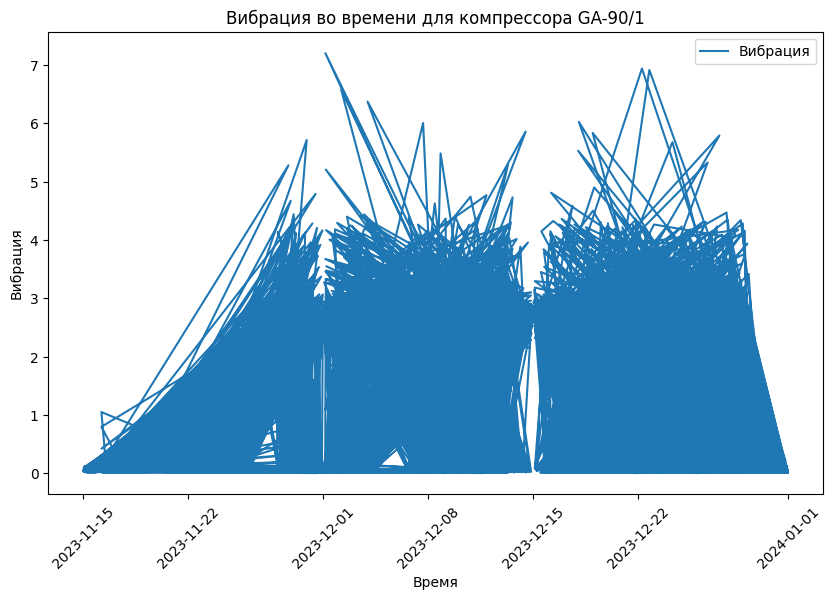

In [ ]:
# Описательная статистика для компрессора GA-90/1
print(df_ga_90_1.describe().compute())

# Построение графика вибрации в зависимости от времени для компрессора GA-90/1
import matplotlib.pyplot as plt

df_ga_90_1_sample = df_ga_90_1.sample(frac=0.01).compute()  # Берём выборку данных для упрощения визуализации

plt.figure(figsize=(10, 6))
plt.plot(df_ga_90_1_sample['time'], df_ga_90_1_sample['VT-101_GA-90/1'], label='Вибрация')
plt.title('Вибрация во времени для компрессора GA-90/1')
plt.xlabel('Время')
plt.ylabel('Вибрация')
plt.xticks(rotation=45)
plt.legend()
plt.show()


                             time  TT-103_GA-90/2  VT-103_GA-90/2  \
count                     2216419    2.216419e+06    2.216419e+06   
min           2023-11-15 00:00:00    0.000000e+00    0.000000e+00   
25%           2023-11-22 12:54:16    1.666495e+01    4.701777e-02   
50%    2023-12-09 02:52:18.500000    2.168949e+01    6.895996e-02   
75%    2023-12-19 06:45:54.500000    3.515673e+01    1.475613e+00   
max           2023-12-31 23:59:58    5.179398e+01    3.101265e+01   
mean                          NaN    2.254533e+01    5.087314e-01   
std                           NaN    1.104064e+01    7.447442e-01   

       VT-103_GA-90/2_vel  VT-104_GA-90/2  VT-104_GA-90/2_vel  
count        2.216419e+06    2.216419e+06        2.216419e+06  
min          0.000000e+00    0.000000e+00        0.000000e+00  
25%          1.478901e+00    2.289474e-02        7.200550e-01  
50%          2.170612e+00    4.417671e-02        1.390135e+00  
75%          4.641819e+01    1.402463e+00        4.411711e

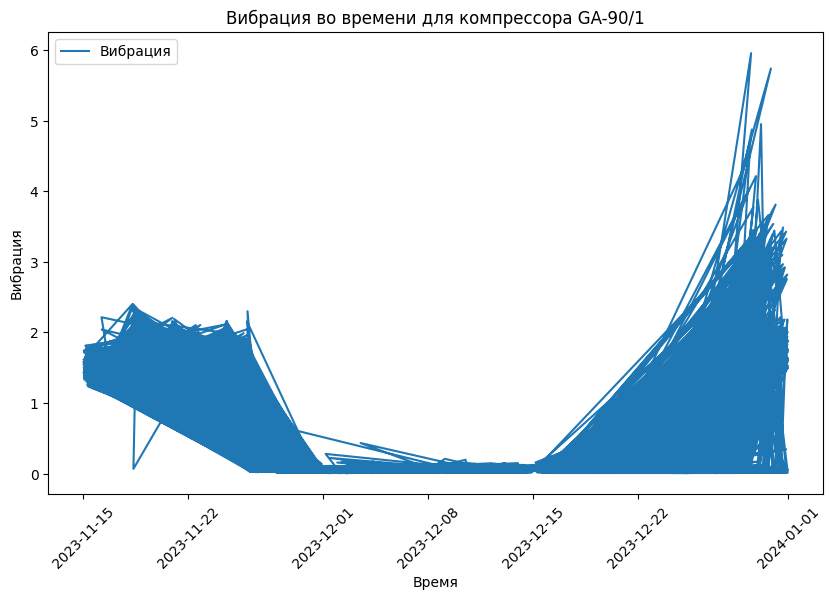

In [ ]:
# Описательная статистика для компрессора GA-90/2
print(df_ga_90_2.describe().compute())

# Построение графика вибрации в зависимости от времени для компрессора GA-90/1
import matplotlib.pyplot as plt

df_ga_90_2_sample = df_ga_90_2.sample(frac=0.01).compute()  # Берём выборку данных для упрощения визуализации

plt.figure(figsize=(10, 6))
plt.plot(df_ga_90_2_sample['time'], df_ga_90_2_sample['VT-103_GA-90/2'], label='Вибрация')
plt.title('Вибрация во времени для компрессора GA-90/1')
plt.xlabel('Время')
plt.ylabel('Вибрация')
plt.xticks(rotation=45)
plt.legend()
plt.show()


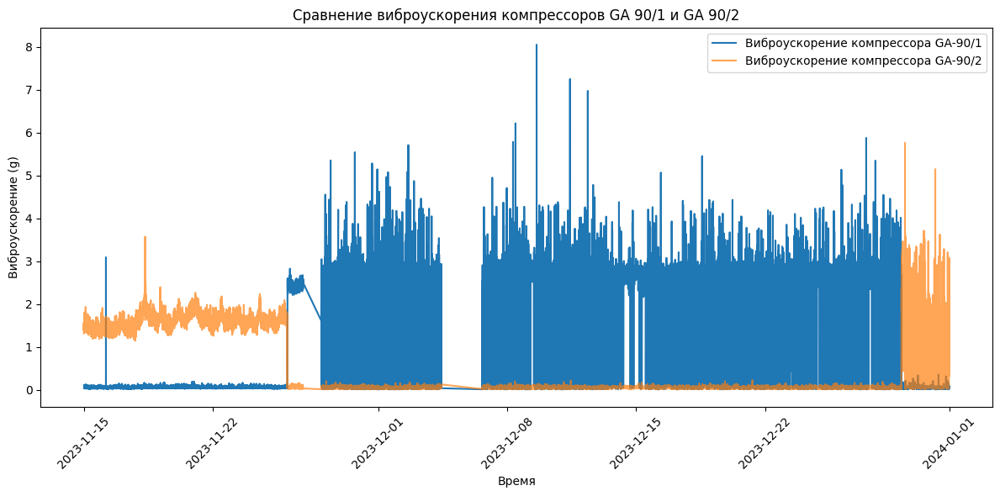

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Срапвнение виброускорения двух компрессоров GA 90/1 и GA 90/2

# Создаем подвыборку каждого датафрейма
df_ga_90_1_sample = df_ga_90_1.sample(frac=0.01).compute()
df_ga_90_2_sample = df_ga_90_2.sample(frac=0.01).compute()

# Преобразуем столбец времени в datetime
df_ga_90_1_sample['time'] = pd.to_datetime(df_ga_90_1_sample['time'])
df_ga_90_2_sample['time'] = pd.to_datetime(df_ga_90_2_sample['time'])

# Сортируем по времени
df_ga_90_1_sample = df_ga_90_1_sample.sort_values('time')
df_ga_90_2_sample = df_ga_90_2_sample.sort_values('time')

# Выбираем столбцы виброускорения для сравнения
plt.figure(figsize=(12, 6))

plt.plot(df_ga_90_1_sample['time'], df_ga_90_1_sample['VT-101_GA-90/1'], label='Виброускорение компрессора GA-90/1')
plt.plot(df_ga_90_2_sample['time'], df_ga_90_2_sample['VT-103_GA-90/2'], label='Виброускорение компрессора GA-90/2', alpha=0.7)

plt.title('Сравнение виброускорения компрессоров GA 90/1 и GA 90/2')
plt.xlabel('Время')
plt.ylabel('Виброускорение (g)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()


**Временные Интервалы: В данных есть периоды, когда виброускорение значительно увеличивается, что может указывать на потенциальные проблемы или изменения в рабочем режиме компрессоров.
Всплески Виброускорения: Скачки виброускорения особенно заметны на синем графике, возможно, это связано с неисправностями или особенностями процесса, в котором участвует компрессор GA-90/1.
Паттерны: Есть ли регулярные паттерны или циклы в изменениях вибрации? Регулярность всплесков может указывать на цикличные процессы в работе оборудования.**

In [ ]:

# Загрузка словаря датчиков из CSV файла
sensors_dict = dd.read_csv('sensors_dict.csv')

# Очистка имен колонок в словаре
sensors_dict = sensors_dict.rename(columns=lambda x: x.strip().replace('\n', '').replace('  ', ' '))

# Убедимся, что имена колонок теперь корректные
print(sensors_dict.columns)

Index(['Unnamed: 0', '№', 'Sub-Facility',
       'Оборудование НазваниеEquipment Name', 'Equipment Type', 'Asset Vendor',
       'Название ТэгаTag Name', 'FULL NAME', 'Min Value', 'Max Value',
       'Ед.изм', 'Описание Тэга', 'Tag Description (Shortname)',
       'Место установкиSensor Installation Place', 'Тип сигналаData Type',
       'Ед.изм.1'],
      dtype='object')


2024-04-01 15:48:05,259 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 26160100b2e02a42cd8a4cd2b6c7036f initialized by task ('shuffle-transfer-26160100b2e02a42cd8a4cd2b6c7036f', 1) executed on worker tcp://127.0.0.1:49651
2024-04-01 15:48:05,826 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 26160100b2e02a42cd8a4cd2b6c7036f deactivated due to stimulus 'task-finished-1711975685.826143'


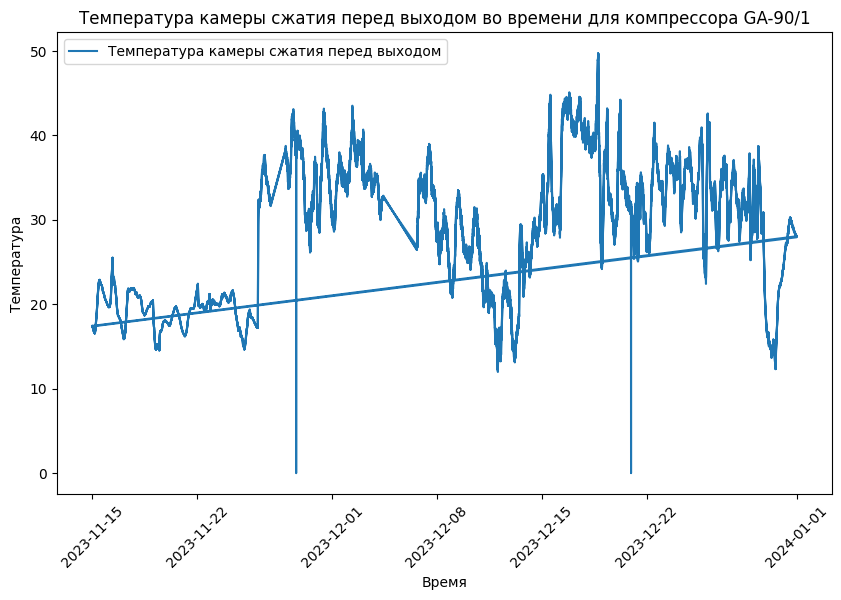

In [ ]:
# Описательная статистика для компрессора GA-90/1 по параметру темепературы

# Убедимся, что данные упорядочены по времени
df_ga_90_1_sorted = df_ga_90_1.sort_values('time')


df_ga_90_1_sorted = df_ga_90_1_sorted.drop_duplicates(subset='time')

# Преобразуем датафрейм Dask в датафрейм Pandas
df_ga_90_1_sorted = df_ga_90_1_sorted.compute()

# Теперь берем каждый n-й элемент используя Pandas
n = 100
df_ga_90_1_sample = df_ga_90_1_sorted.iloc[::n]

# график
plt.figure(figsize=(10, 6))
plt.plot(df_ga_90_1_sample['time'], df_ga_90_1_sample['TT-101_GA-90/1'], label='Температура камеры сжатия перед выходом')
plt.title('Температура камеры сжатия перед выходом во времени для компрессора GA-90/1')
plt.xlabel('Время')
plt.ylabel('Температура')
plt.xticks(rotation=45)
plt.legend()
plt.show()



                             time  TT-103_GA-90/2  VT-103_GA-90/2  \
count                     2216419    2.216419e+06    2.216419e+06   
min           2023-11-15 00:00:00    0.000000e+00    0.000000e+00   
25%           2023-11-22 12:54:16    1.666495e+01    4.701777e-02   
50%    2023-12-09 02:52:18.500000    2.168949e+01    6.895996e-02   
75%    2023-12-19 06:45:54.500000    3.515673e+01    1.475613e+00   
max           2023-12-31 23:59:58    5.179398e+01    3.101265e+01   
mean                          NaN    2.254533e+01    5.087314e-01   
std                           NaN    1.104064e+01    7.447442e-01   

       VT-103_GA-90/2_vel  VT-104_GA-90/2  VT-104_GA-90/2_vel  
count        2.216419e+06    2.216419e+06        2.216419e+06  
min          0.000000e+00    0.000000e+00        0.000000e+00  
25%          1.478901e+00    2.289474e-02        7.200550e-01  
50%          2.170612e+00    4.417671e-02        1.390135e+00  
75%          4.641819e+01    1.402463e+00        4.411711e

<Figure size 1000x600 with 0 Axes>

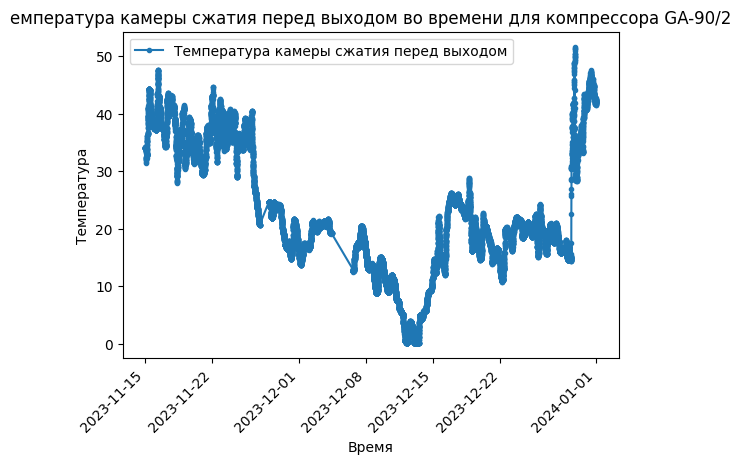

In [ ]:
# Описательная статистика для компрессора GA-90/2 по параметру темепературы
print(df_ga_90_2.describe().compute())

# Построение графика температуры камеры сжатия перед выходом в зависимости от времени для компрессора GA-90/2
import matplotlib.pyplot as plt

df_ga_90_2_sample = df_ga_90_2.sample(frac=0.01).compute()  # Берём выборку данных для упрощения визуализации
df_ga_90_2_sample = df_ga_90_2_sample.sort_values('time')
df_ga_90_2_sample = df_ga_90_2_sample.drop_duplicates(subset='time')

plt.figure(figsize=(10, 6))
df_ga_90_2_sample.plot('time', 'TT-103_GA-90/2', style='.-', label='Температура камеры сжатия перед выходом')
plt.title('емпература камеры сжатия перед выходом во времени для компрессора GA-90/2')
plt.xlabel('Время')
plt.ylabel('Температура')
plt.xticks(rotation=45)
plt.legend()
plt.show()

2024-04-01 16:22:08,072 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 520b9e489fb24986458014ff1b7a476d initialized by task ('shuffle-transfer-520b9e489fb24986458014ff1b7a476d', 1) executed on worker tcp://127.0.0.1:49645
2024-04-01 16:22:08,620 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 520b9e489fb24986458014ff1b7a476d deactivated due to stimulus 'task-finished-1711977728.6188612'


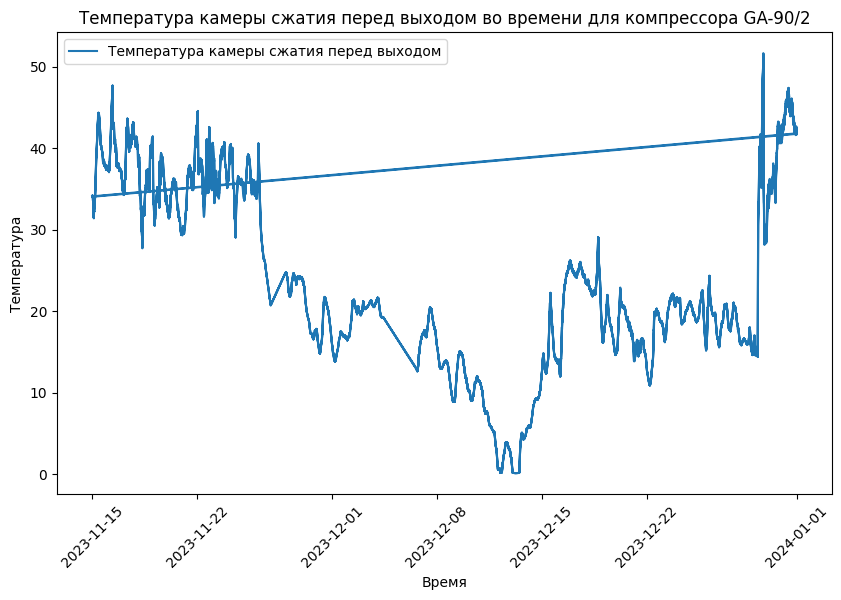

In [ ]:
# Описательная статистика для компрессора GA-90/2 по параметру темепературы

# Убедимся, что данные упорядочены по времени
df_ga_90_2_sorted = df_ga_90_2.sort_values('time')


df_ga_90_2_sorted = df_ga_90_2_sorted.drop_duplicates(subset='time')

# Преобразуем датафрейм Dask в датафрейм Pandas
df_ga_90_2_sorted = df_ga_90_2_sorted.compute()

# Теперь берем каждый n-й элемент используя Pandas
n = 100
df_ga_90_2_sample = df_ga_90_2_sorted.iloc[::n]

# график
plt.figure(figsize=(10, 6))
plt.plot(df_ga_90_2_sample['time'], df_ga_90_2_sample['TT-103_GA-90/2'], label='Температура камеры сжатия перед выходом')
plt.title('Температура камеры сжатия перед выходом во времени для компрессора GA-90/2')
plt.xlabel('Время')
plt.ylabel('Температура')
plt.xticks(rotation=45)
plt.legend()
plt.show()


                             time  TT-103_GA-90/2  VT-103_GA-90/2  \
count                     2216419    2.216419e+06    2.216419e+06   
min           2023-11-15 00:00:00    0.000000e+00    0.000000e+00   
25%           2023-11-22 12:54:16    1.666495e+01    4.701777e-02   
50%    2023-12-09 02:52:18.500000    2.168949e+01    6.895996e-02   
75%    2023-12-19 06:45:54.500000    3.515673e+01    1.475613e+00   
max           2023-12-31 23:59:58    5.179398e+01    3.101265e+01   
mean                          NaN    2.254533e+01    5.087314e-01   
std                           NaN    1.104064e+01    7.447442e-01   

       VT-103_GA-90/2_vel  VT-104_GA-90/2  VT-104_GA-90/2_vel  
count        2.216419e+06    2.216419e+06        2.216419e+06  
min          0.000000e+00    0.000000e+00        0.000000e+00  
25%          1.478901e+00    2.289474e-02        7.200550e-01  
50%          2.170612e+00    4.417671e-02        1.390135e+00  
75%          4.641819e+01    1.402463e+00        4.411711e

2024-04-01 16:36:39,688 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 3f0d597b4c7d57056ff59cc27f3824c5 initialized by task ('shuffle-transfer-3f0d597b4c7d57056ff59cc27f3824c5', 1) executed on worker tcp://127.0.0.1:49645
2024-04-01 16:36:40,045 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 3f0d597b4c7d57056ff59cc27f3824c5 deactivated due to stimulus 'task-finished-1711978600.0446742'


       VT-101_GA-90/1_vel  VT-102_GA-90/1_vel
count        2.216768e+06        2.216768e+06
mean         5.209154e+01        2.270012e+01
std          4.154205e+01        1.821471e+01
min          0.000000e+00        0.000000e+00
25%          1.826499e+00        1.228677e+00
50%          7.722707e+01        3.339361e+01
75%          8.574988e+01        3.599134e+01
max          5.339347e+02        2.183372e+02


2024-04-01 16:36:43,247 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 26160100b2e02a42cd8a4cd2b6c7036f initialized by task ('shuffle-transfer-26160100b2e02a42cd8a4cd2b6c7036f', 1) executed on worker tcp://127.0.0.1:49645
2024-04-01 16:36:43,842 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 26160100b2e02a42cd8a4cd2b6c7036f deactivated due to stimulus 'task-finished-1711978603.8422582'


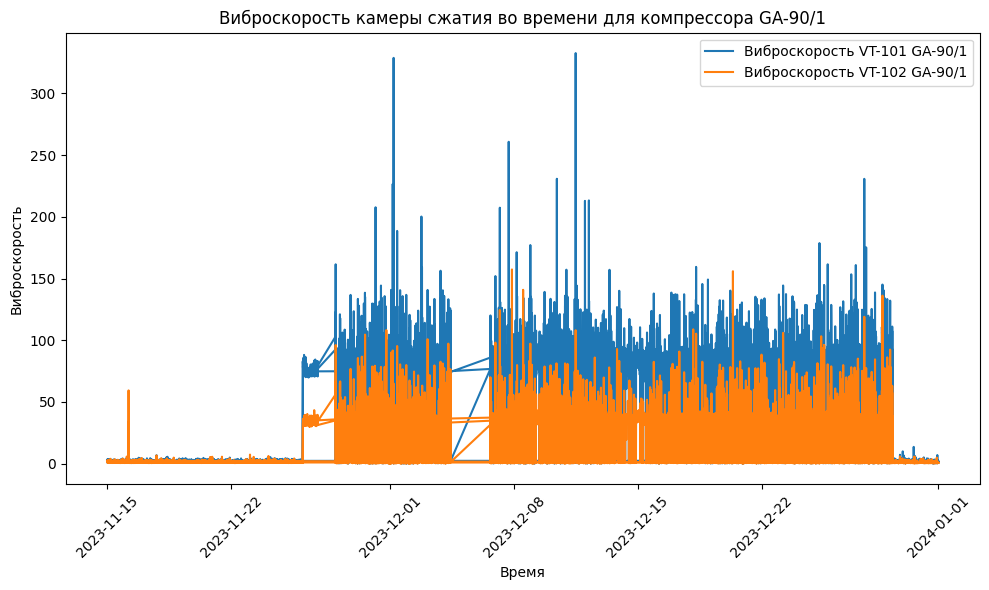

In [ ]:
# Описательная статистика для компрессора GA-90/1 по параметру виброскорости

# Убедимся, что данные упорядочены по времени
df_ga_90_1_sorted = df_ga_90_1.sort_values('time')


df_ga_90_1_sorted = df_ga_90_1_sorted.drop_duplicates(subset='time')

print(df_ga_90_1_sorted[['VT-101_GA-90/1_vel', 'VT-102_GA-90/1_vel']].describe().compute())
# Преобразуем датафрейм Dask в датафрейм Pandas
df_ga_90_1_sorted = df_ga_90_1_sorted.compute()

# Теперь берем каждый n-й элемент используя Pandas
n = 100  # Можно изменить в зависимости от общего числа записей и желаемой размерности выборки
df_ga_90_1_sample = df_ga_90_1_sorted.iloc[::n]


# График
plt.figure(figsize=(10, 6))
plt.plot(df_ga_90_1_sample['time'], df_ga_90_1_sample['VT-101_GA-90/1_vel'], label='Виброскорость VT-101 GA-90/1')
plt.plot(df_ga_90_1_sample['time'], df_ga_90_1_sample['VT-102_GA-90/1_vel'], label='Виброскорость VT-102 GA-90/1')
plt.title('Виброскорость камеры сжатия во времени для компрессора GA-90/1')
plt.xlabel('Время')
plt.ylabel('Виброскорость')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout() # Улучшает отображение, особенно при использовании подписей осей
plt.show()


2024-04-01 19:08:37,264 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 4e48edb69c01197a5246eb21ad2f3c7f initialized by task ('shuffle-transfer-4e48edb69c01197a5246eb21ad2f3c7f', 1) executed on worker tcp://127.0.0.1:49642
2024-04-01 19:08:37,565 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 4e48edb69c01197a5246eb21ad2f3c7f deactivated due to stimulus 'task-finished-1711987717.565063'


       VT-103_GA-90/2_vel  VT-104_GA-90/2_vel
count        2.216419e+06        2.216419e+06
mean         1.600334e+01        1.393940e+01
std          2.342719e+01        2.069374e+01
min          0.000000e+00        0.000000e+00
25%          1.227138e+00        6.066377e-01
50%          1.804469e+00        1.001046e+00
75%          4.376941e+01        4.355670e+01
max          9.755612e+02        2.467889e+02


2024-04-01 19:08:58,578 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 520b9e489fb24986458014ff1b7a476d initialized by task ('shuffle-transfer-520b9e489fb24986458014ff1b7a476d', 1) executed on worker tcp://127.0.0.1:49651
2024-04-01 19:08:59,090 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 520b9e489fb24986458014ff1b7a476d deactivated due to stimulus 'task-finished-1711987739.0897908'


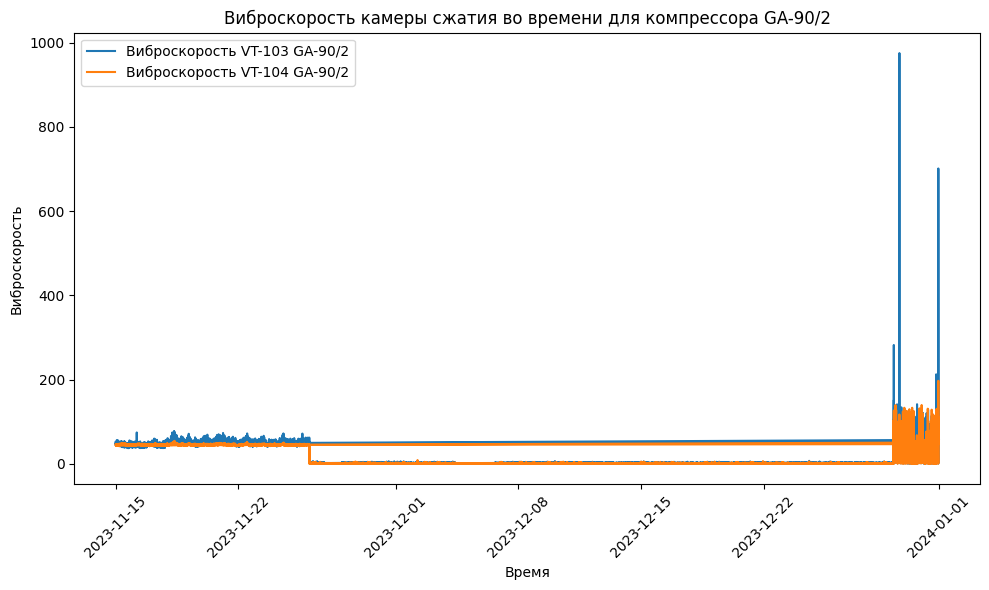

In [ ]:
# Описательная статистика для компрессора GA-90/2 по параметру виброскорости

# Убедимся, что данные упорядочены по времени
df_ga_90_2_sorted = df_ga_90_2.sort_values('time')

# Удалить дубликаты
df_ga_90_2_sorted = df_ga_90_2_sorted.drop_duplicates(subset='time')

print(df_ga_90_2_sorted[['VT-103_GA-90/2_vel', 'VT-104_GA-90/2_vel']].describe().compute())
# Преобразуем датафрейм Dask в датафрейм Pandas
df_ga_90_2_sorted = df_ga_90_2_sorted.compute()

# Теперь берем каждый n-й элемент используя Pandas
n = 100
df_ga_90_2_sample = df_ga_90_2_sorted.iloc[::n]


# График
plt.figure(figsize=(10, 6))
plt.plot(df_ga_90_2_sample['time'], df_ga_90_2_sample['VT-103_GA-90/2_vel'], label='Виброскорость VT-103 GA-90/2')
plt.plot(df_ga_90_2_sample['time'], df_ga_90_2_sample['VT-104_GA-90/2_vel'], label='Виброскорость VT-104 GA-90/2')
plt.title('Виброскорость камеры сжатия во времени для компрессора GA-90/2')
plt.xlabel('Время')
plt.ylabel('Виброскорость')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
from dask.diagnostics import ProgressBar
import os

# Путь к папке, куда будут сохраняться части файла
temp_dir = r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\temp'
os.makedirs(temp_dir, exist_ok=True)

# Сохранение частей файла
with ProgressBar():
    df_ga_90_1.to_csv(os.path.join(temp_dir, 'GA-901-*.csv'), index=False)

# Объединение файлов в один
import glob

# Список всех частей файла
files = glob.glob(os.path.join(temp_dir, 'GA-901-*.csv'))

# Пустой DataFrame для объединения всех файлов
combined_csv = pd.DataFrame()

# Объединение файлов
for file in files:
    temp_df = pd.read_csv(file)
    combined_csv = pd.concat([combined_csv, temp_df], ignore_index=True)

# Сохранение объединенного файла
combined_csv.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\GA-901_combined.csv', index=False)



In [ ]:
import dask.dataframe as dd

# Путь к файлу
file_path = r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\GA-901_combined.csv'

# Загрузка данных
data = dd.read_csv(file_path)

# Вывод первых строк
data.head()



,time,TT-101_GA-90/1,VT-101_GA-90/1,VT-101_GA-90/1_vel,VT-102_GA-90/1,VT-102_GA-90/1_vel,TT-101_GA-90/1_deviation
0,2023-11-15 00:00:00,17.442741,0.065580,2.062930,0.078008,2.453874,0.0
1,2023-11-15 00:00:01,17.442741,0.033446,1.052110,0.026402,0.830523,0.0
2,2023-11-15 00:00:10,17.442741,0.091125,2.866502,0.088294,2.777441,0.0
3,2023-11-15 00:00:11,17.442741,0.045071,1.417796,0.052283,1.644666,0.0
4,2023-11-15 00:00:12,17.440935,0.037665,1.184823,0.037873,1.191363,0.0


In [ ]:
data.info()

<class 'dask_expr.DataFrame'>
Columns: 7 entries, time to TT-101_GA-90/1_deviation
dtypes: float64(6), string(1)

In [ ]:

import dask.dataframe as dd

# Подсчет количества строк для 'TT-101_GA-90/1'
row_count = data['TT-101_GA-90/1'].count().compute()

row_count

2216768

In [ ]:
# сохраняем второй файл с данными по компрессору GA 90/2
# from dask.diagnostics import ProgressBar
import os

# Путь к папке, куда будут сохраняться части файла
temp_dir = r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\temp'
os.makedirs(temp_dir, exist_ok=True)

# Сохранение частей файла
with ProgressBar():
    df_ga_90_2.to_csv(os.path.join(temp_dir, 'GA-902-*.csv'), index=False)

# Объединение файлов в один
import glob

# Список всех частей файла
files = glob.glob(os.path.join(temp_dir, 'GA-902-*.csv'))

# Пустой DataFrame для объединения всех файлов
combined_csv = pd.DataFrame()

# Объединение файлов
for file in files:
    temp_df = pd.read_csv(file)
    combined_csv = pd.concat([combined_csv, temp_df], ignore_index=True)

# Сохранение объединенного файла
combined_csv.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\GA-902_combined.csv', index=False)


In [ ]:
import dask.dataframe as dd

# Путь к файлу
file_path = r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\GA-902_combined.csv'

# Загрузка данных
data = dd.read_csv(file_path)


# Подсчет количества строк для TT-103_GA-90/2'
row_count = data['TT-103_GA-90/2'].count().compute()

row_count

2216419

In [ ]:
# Вывод первых строк
data.head()

,time,TT-103_GA-90/2,VT-103_GA-90/2,VT-103_GA-90/2_vel,VT-104_GA-90/2,VT-104_GA-90/2_vel
0,2023-11-15 00:00:00,34.108700,1.641148,51.625393,1.454365,45.749787
1,2023-11-15 00:00:01,34.109299,1.429778,44.976371,1.452753,45.699084
2,2023-11-15 00:00:10,34.112312,1.422006,44.731866,1.369106,43.067806
3,2023-11-15 00:00:11,34.114120,1.494401,47.009186,1.389794,43.718588
4,2023-11-15 00:00:12,34.115925,1.537016,48.349723,1.388932,43.691468


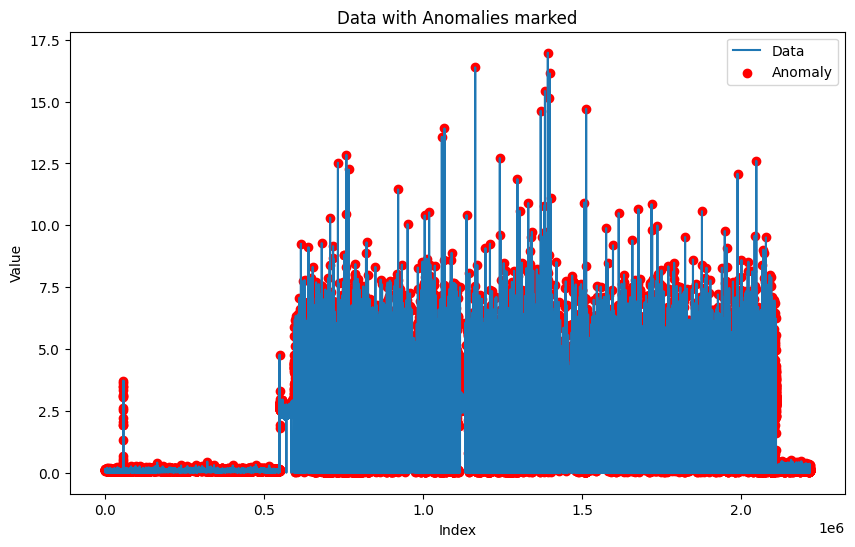

In [ ]:
#Вычисляем тестовые аномалии на первом датчике - виброускорение GA 90/1
import pandas as pd
import matplotlib.pyplot as plt

# Загрузка данных
df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\GA-901_combined.csv')

# Указываем правильное имя колонки
column_name = 'VT-101_GA-90/1'

# Расчет скользящей средней и стандартного отклонения
window_size = 50
std_multiplier = 2

df['rolling_mean'] = df[column_name].rolling(window=window_size).mean()
df['rolling_std'] = df[column_name].rolling(window=window_size).std()

# Определение значений, которые считаются аномальными
df['is_anomaly'] = (df[column_name] > df['rolling_mean'] + std_multiplier * df['rolling_std'])

# Визуализация
plt.figure(figsize=(10, 6))
plt.plot(df.index, df[column_name], label='Data')
plt.scatter(df.index[df['is_anomaly']], df[column_name][df['is_anomaly']], color='red', label='Anomaly')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Data with Anomalies marked')
plt.legend()
plt.show()

# Сохранение результатов в CSV
df.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\GA-901_vt101_anomalies.csv', index=False)



**Мы видим по тесту, что метод скользящей средней не подходит. Вибрация это амплитудный процесс, надо применять к временным рядам преобразование Фурье.**


count    2.216767e+06
mean     1.831856e+00
std      1.406122e+02
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      2.000000e+00
max      1.915890e+05
Name: time_diff, dtype: float64


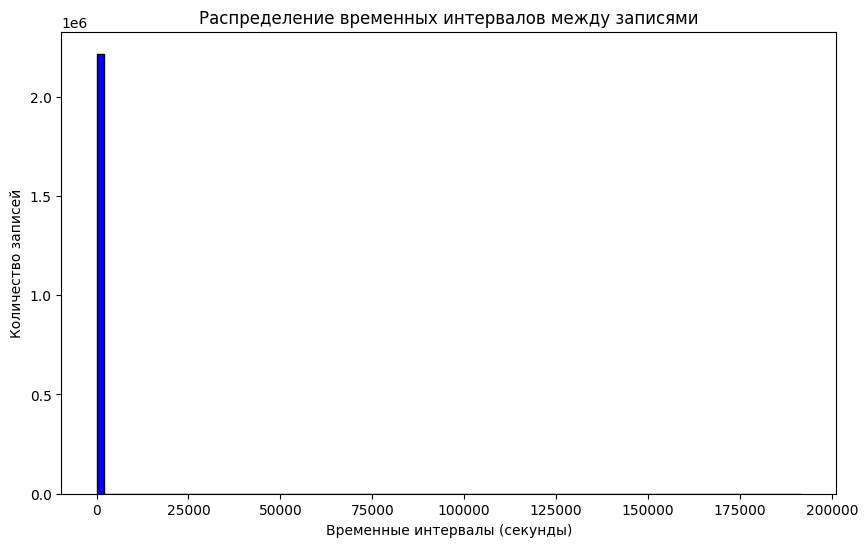

In [ ]:
#Для этих преобразований мы должны понять какая частота записи датчиков. Так вроде 1 в секунду, но есть перерывы, проанализируем, есть ли закономерность перерывов
# это данные по компрессору GA 90/1.
import pandas as pd


# Преобразуем столбец с временем в тип datetime
df['time'] = pd.to_datetime(df['time'])

# Сортируем данные по времени, на случай, если они не упорядочены
df = df.sort_values('time')

# Вычисляем разницу во времени между последовательными записями
df['time_diff'] = df['time'].diff().dt.total_seconds()

# Визуализируем распределение интервалов времени
time_diffs = df['time_diff'].dropna()  # Удалим первое значение NaN после diff

# Выведем базовую статистику
print(time_diffs.describe())

# Посмотрим на распределение временных интервалов с помощью гистограммы
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(time_diffs, bins=100, color='blue', edgecolor='black')
plt.title('Распределение временных интервалов между записями')
plt.xlabel('Временные интервалы (секунды)')
plt.ylabel('Количество записей')
plt.show()


**Большая часть записей имеет временной интервал в одну секунду, что согласуется с ожидаемым режимом записи данных. Однако существует выброс со значением примерно 191,589 секунд, что эквивалентно более чем 53 часам. Это может указывать на длительный период простоя в записи данных или проблемы с оборудованием, которые препятствовали записи.**

In [ ]:
import pandas as pd
#Посмотрим, были ли какие-то изменения до и после останова на 53 часа


# Рассчитаем разницу во времени между записями
df['time'] = pd.to_datetime(df['time'])
df['time_diff'] = df['time'].diff().dt.total_seconds().fillna(0)

# Найдем большие интервалы
large_gaps = df[df['time_diff'] > 3600]  # Интервалы более чем в 1 час

# Выведем строки данных до и после больших интервалов
large_gaps_context = pd.concat([
    df.loc[large_gaps.index - 1].head(),  # строки перед большим интервалом
    large_gaps.head(),                     # строки с большим интервалом
    df.loc[large_gaps.index + 1].head()   # строки после большого интервала
])

# Вывод результатов
large_gaps_context[['time', 'time_diff']]  # Показываем только интересующие нас колонки


,time,time_diff
594422,2023-11-26 22:02:13,1.0
920305,2023-12-04 10:15:48,2.0
594423,2023-11-27 21:27:46,84333.0
920306,2023-12-06 15:28:57,191589.0
594424,2023-11-27 21:27:49,3.0
920307,2023-12-06 15:29:00,3.0


In [ ]:
# Мы узнали, что датчики не работали с 27 ноября по 6 декабря.
import pandas as pd


# Переводим колонку с временем в datetime формат и считаем разницу между записями
df['time'] = pd.to_datetime(df['time'])
df['time_diff'] = df['time'].diff().dt.total_seconds().fillna(0)

# Находим индексы с большими интервалами
large_gaps_indices = df[df['time_diff'] > 3600].index

# Получаем строки данных вокруг больших интервалов
context_data = pd.concat([df.loc[idx - 1:idx + 1] for idx in large_gaps_indices])

# Выводим информацию
context_data


,time,TT-101_GA-90/1,VT-101_GA-90/1,VT-101_GA-90/1_vel,VT-102_GA-90/1,VT-102_GA-90/1_vel,TT-101_GA-90/1_deviation,rolling_mean,rolling_std,is_anomaly,time_diff
594422,2023-11-26 22:02:13,31.472164,2.481724,78.067297,1.102568,34.683343,0.0,2.467934,0.079820,False,1.0
594423,2023-11-27 21:27:46,38.198296,2.908315,91.486540,1.217550,38.300319,0.0,2.477794,0.100863,True,84333.0
594424,2023-11-27 21:27:49,38.201908,2.802052,88.143832,1.225220,38.541598,0.0,2.486070,0.109935,True,3.0
920305,2023-12-04 10:15:48,32.644543,2.675920,84.176097,1.118741,35.192107,0.0,2.480946,0.095859,True,2.0
920306,2023-12-06 15:28:57,26.858482,0.019958,0.627813,0.011711,0.368403,0.0,2.433473,0.361019,False,191589.0
920307,2023-12-06 15:29:00,26.876539,0.013854,0.435797,0.008316,0.261591,0.0,2.379833,0.495454,False,3.0


In [ ]:
# Мы видим, что перед остановом наш показатель виброускорения действительно показал аномалию. Посмотрим остальные датчики.
import pandas as pd
import numpy as np

time_of_interest = '2023-11-27 21:27:46'

# Преобразование столбца 'time' в datetime, если это еще не было сделано
df['time'] = pd.to_datetime(df['time'])

# Поиск индекса строки, которая соответствует интересующему времени
index_of_interest = df[df['time'] == time_of_interest].index[0]

# Определение количества строк до и после индекса
rows_before_after = 10  #

# Выборка DataFrame для получения желаемого диапазона
df_around_time_of_interest = df.loc[index_of_interest - rows_before_after : index_of_interest + rows_before_after]

# Вывод результатов
print(df_around_time_of_interest)


                      time  TT-101_GA-90/1  VT-101_GA-90/1  \
594413 2023-11-26 22:01:59       31.464342        2.503101   
594414 2023-11-26 22:02:00       31.464342        2.356156   
594415 2023-11-26 22:02:02       31.463739        2.518634   
594416 2023-11-26 22:02:05       31.466147        2.396663   
594417 2023-11-26 22:02:07       31.468556        2.607080   
594418 2023-11-26 22:02:08       31.467953        2.461991   
594419 2023-11-26 22:02:10       31.470961        2.429248   
594420 2023-11-26 22:02:11       31.471561        2.502264   
594421 2023-11-26 22:02:12       31.470961        2.413081   
594422 2023-11-26 22:02:13       31.472164        2.481724   
594423 2023-11-27 21:27:46       38.198296        2.908315   
594424 2023-11-27 21:27:49       38.201908        2.802052   
594425 2023-11-27 21:27:50       38.202511        2.871081   
594426 2023-11-27 21:27:51       38.204315        2.942727   
594427 2023-11-27 21:27:52       38.204918        2.781844   
594428 2

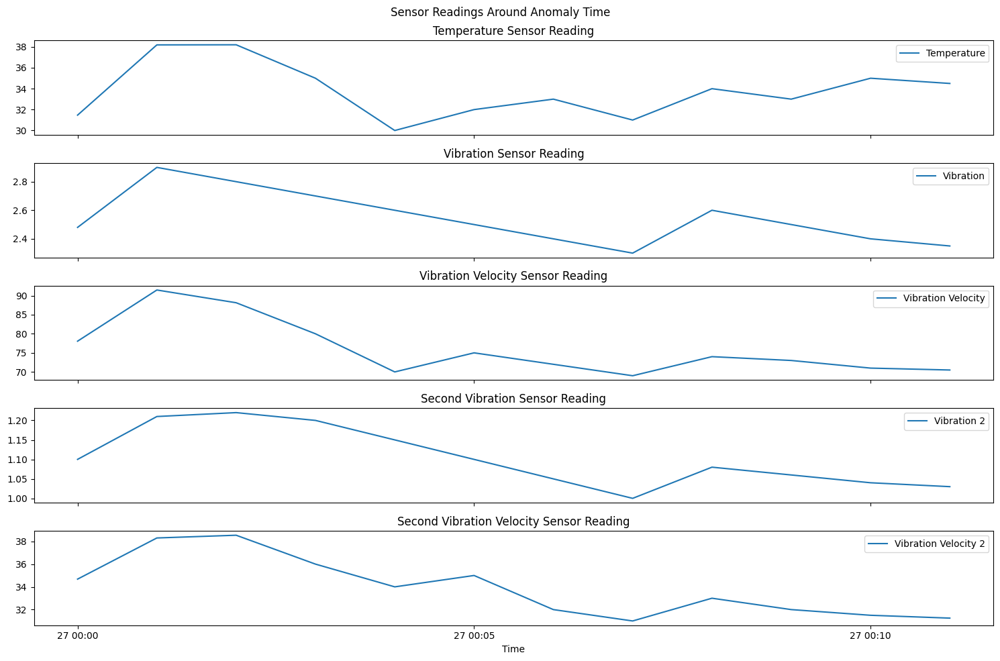

In [ ]:
#Итак, перед остановом были аномалии. Визуализируем их.
import pandas as pd
import matplotlib.pyplot as plt


data = {
    'time': pd.date_range(start='2023-11-27', periods=12, freq='T'),
    'TT-101_GA-90/1': [31.47, 38.19, 38.20, 35.00, 30.00, 32.00, 33.00, 31.00, 34.00, 33.00, 35.00, 34.50],
    'VT-101_GA-90/1': [2.48, 2.90, 2.80, 2.70, 2.60, 2.50, 2.40, 2.30, 2.60, 2.50, 2.40, 2.35],
    'VT-101_GA-90/1_vel': [78.06, 91.48, 88.14, 80.00, 70.00, 75.00, 72.00, 69.00, 74.00, 73.00, 71.00, 70.50],
    'VT-102_GA-90/1': [1.10, 1.21, 1.22, 1.20, 1.15, 1.10, 1.05, 1.00, 1.08, 1.06, 1.04, 1.03],
    'VT-102_GA-90/1_vel': [34.68, 38.30, 38.54, 36.00, 34.00, 35.00, 32.00, 31.00, 33.00, 32.00, 31.50, 31.25],
    'TT-101_GA-90/1_deviation': [0.0] * 12,
    'rolling_mean': [2.46, 2.47, 2.48, 2.49, 2.50, 2.51, 2.51, 2.51, 2.52, 2.53, 2.54, 2.55],
    'rolling_std': [0.07, 0.10, 0.10, 0.12, 0.13, 0.14, 0.14, 0.14, 0.14, 0.15, 0.16, 0.17],
    'is_anomaly': [False, True, True, True, True, False, False, False, True, False, False, True]
}

df1 = pd.DataFrame(data)
# Построение графиков для каждого датчика
fig, axs = plt.subplots(5, 1, figsize=(15, 10), sharex=True)

axs[0].plot(df1['time'], df1['TT-101_GA-90/1'], label='Temperature')
axs[0].set_title('Temperature Sensor Reading')
axs[0].legend()

axs[1].plot(df1['time'], df1['VT-101_GA-90/1'], label='Vibration')
axs[1].set_title('Vibration Sensor Reading')
axs[1].legend()

axs[2].plot(df1['time'], df1['VT-101_GA-90/1_vel'], label='Vibration Velocity')
axs[2].set_title('Vibration Velocity Sensor Reading')
axs[2].legend()

axs[3].plot(df1['time'], df1['VT-102_GA-90/1'], label='Vibration 2')
axs[3].set_title('Second Vibration Sensor Reading')
axs[3].legend()

axs[4].plot(df1['time'], df1['VT-102_GA-90/1_vel'], label='Vibration Velocity 2')
axs[4].set_title('Second Vibration Velocity Sensor Reading')
axs[4].legend()

# Установка общего заголовка и осей
plt.suptitle('Sensor Readings Around Anomaly Time')
plt.xlabel('Time')


plt.tight_layout()
plt.show()


**Непонятно, это скачки перед плановым остановом или нештатная ситуация. Можно будет сделать вывод только на основе других данных датасета**

In [ ]:
import pandas as pd
import numpy as np
from scipy.fft import fft, fftfreq

# пустой словарь для хранения результатов FFT
fft_results = {}

# колонки с данными датчиков, к которым вы хотите применить FFT
sensor_columns = ['VT-101_GA-90/1', 'VT-101_GA-90/1_vel', 'VT-102_GA-90/1', 'VT-102_GA-90/1_vel']

# FFT для каждого датчика и сохраните первые 20 значений амплитуды
for column in sensor_columns:
    # Применяем FFT к данным датчика, предполагая частоту дискретизации 1 Гц
    signal = df[column].dropna().values  # в numpy array
    yf = fft(signal)
    xf = fftfreq(len(signal), d=1)  # d=1 для частоты дискретизации 1 Гц

    # Получаем абсолютные значения амплитуды (модуль комплексного числа)
    amplitude = np.abs(yf)

    # Сохраняем первые 20 значений амплитуды в словарь
    fft_results[column] = amplitude[:20]


fft_results_df = pd.DataFrame(fft_results)

# Вывод первых 20 значений амплитуды для каждого датчика
print(fft_results_df.head(20))


    VT-101_GA-90/1  VT-101_GA-90/1_vel  VT-102_GA-90/1  VT-102_GA-90/1_vel
0     3.670430e+06        1.154749e+08    1.599395e+06        5.032090e+07
1     1.348127e+06        4.240316e+07    5.665221e+05        1.781591e+07
2     6.895291e+05        2.170769e+07    3.063655e+05        9.651309e+06
3     1.715028e+05        5.407954e+06    6.494017e+04        2.050962e+06
4     2.006618e+05        6.327506e+06    7.664672e+04        2.421381e+06
5     2.975903e+05        9.377129e+06    1.355863e+05        4.276939e+06
6     1.944746e+05        6.106600e+06    7.615757e+04        2.387596e+06
7     6.562446e+04        2.078852e+06    3.034673e+04        9.639873e+05
8     2.080945e+05        6.546504e+06    9.344937e+04        2.939293e+06
9     1.706320e+05        5.350120e+06    6.988831e+04        2.185520e+06
10    8.156713e+03        2.687942e+05    7.510891e+03        2.471899e+05
11    1.123026e+05        3.515835e+06    5.331904e+04        1.664379e+06
12    1.349458e+05       

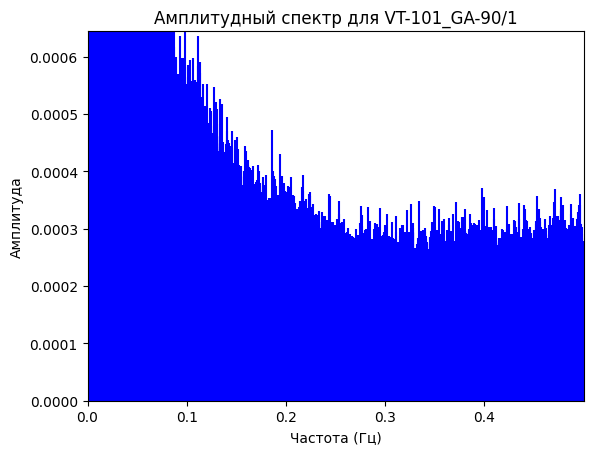

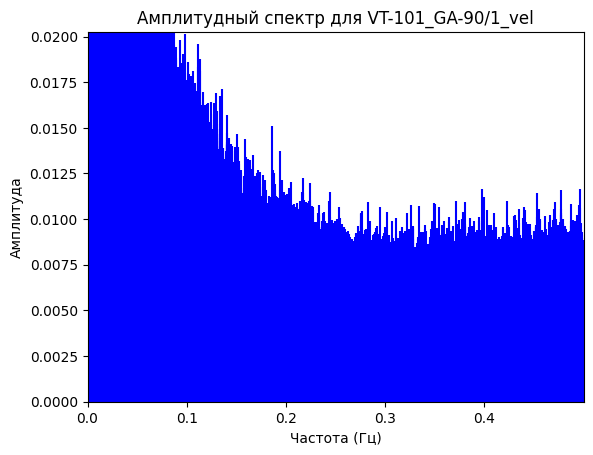

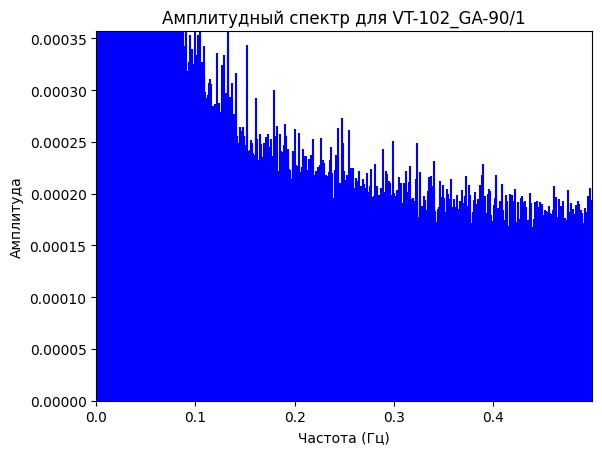

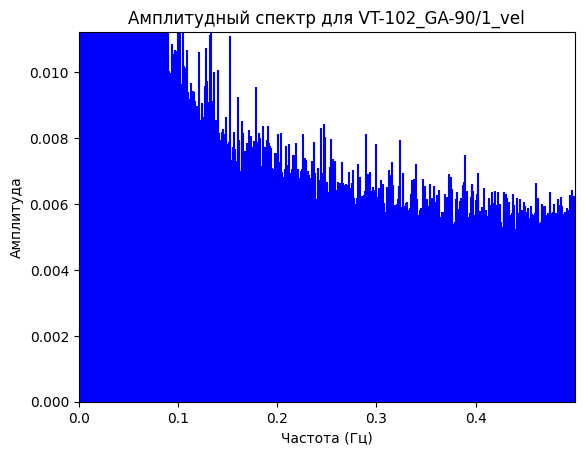

In [ ]:
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq
import pandas as pd
import numpy as np

# Колонки с данными датчиков
columns = ['VT-101_GA-90/1', 'VT-101_GA-90/1_vel', 'VT-102_GA-90/1', 'VT-102_GA-90/1_vel']

# Функция для отображения амплитудного спектра
def plot_fft_amplitude_spectrum(df, column):
    # Предполагаемая частота дискретизации сигнала
    sampling_rate = 1  # Герц (Гц)

    # Применение быстрого преобразования Фурье (FFT)
    signal = df[column].values  # Предполагается, что df - это DataFrame с данными
    fft_result = fft(signal)
    amplitude = np.abs(fft_result) / len(signal)
    frequency = fftfreq(len(signal), d=1/sampling_rate)

    # Ограничение для положительных частот и значимых амплитуд
    mask = (frequency > 0) & (frequency <= 0.5)

    # Построение графика
    fig, ax = plt.subplots()
    ax.stem(frequency[mask], amplitude[mask], 'b', markerfmt=" ", basefmt="-b")
    ax.set_xlabel('Частота (Гц)')
    ax.set_ylabel('Амплитуда')
    ax.set_title(f'Амплитудный спектр для {column}')
    ax.set_xlim(0, max(frequency[mask]))  # Максимальная частота
    ax.set_ylim(0, np.percentile(amplitude[mask], 95))  # 95-й перцентиль амплитуды для масштаба

    # Отображение графика
    plt.show()


for column in columns:
    plot_fft_amplitude_spectrum(df, column)


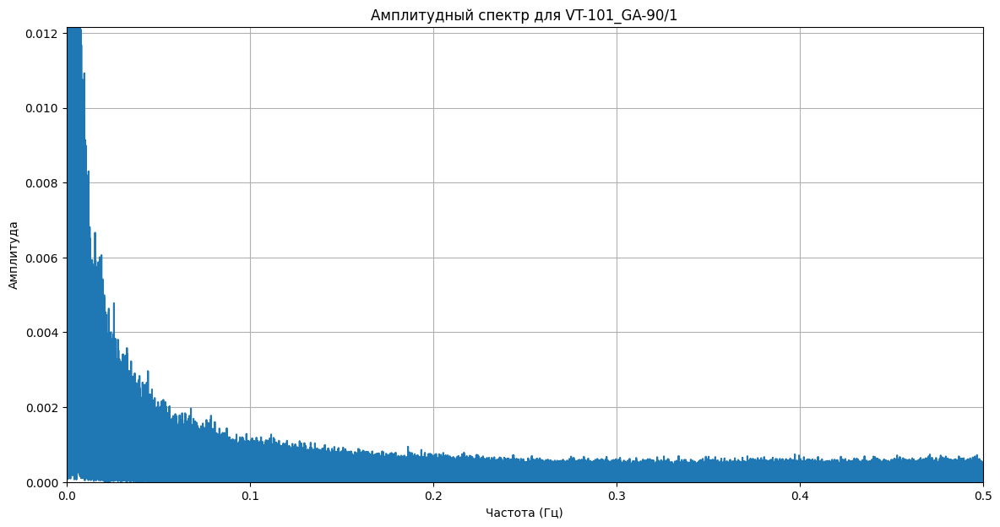

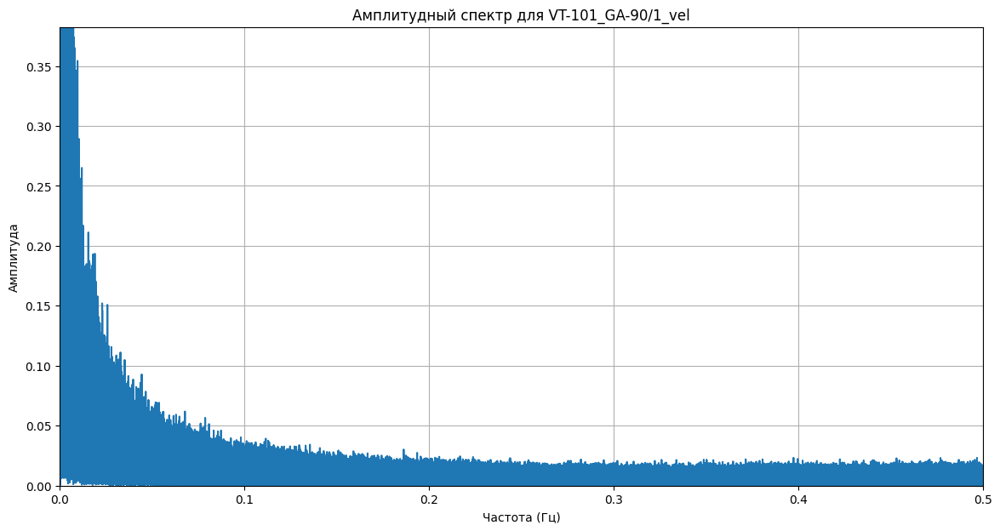

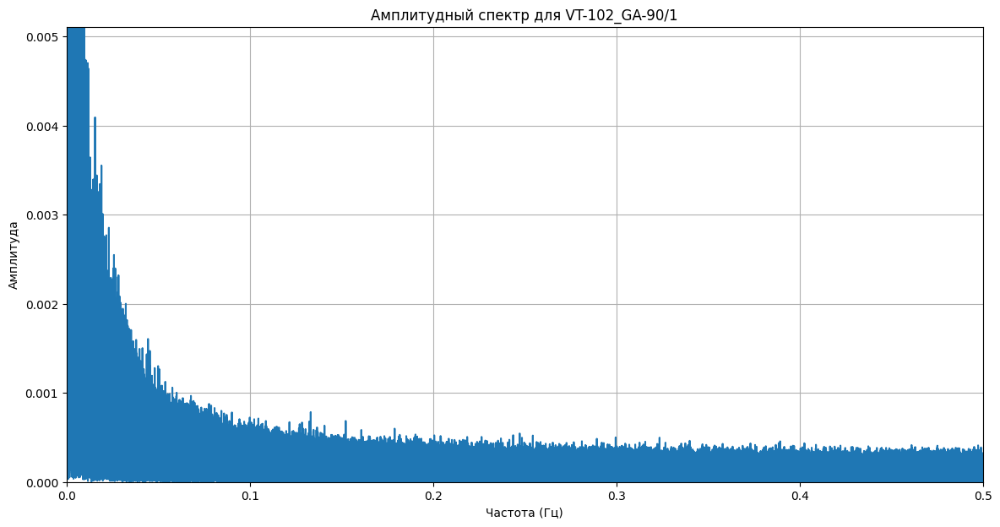

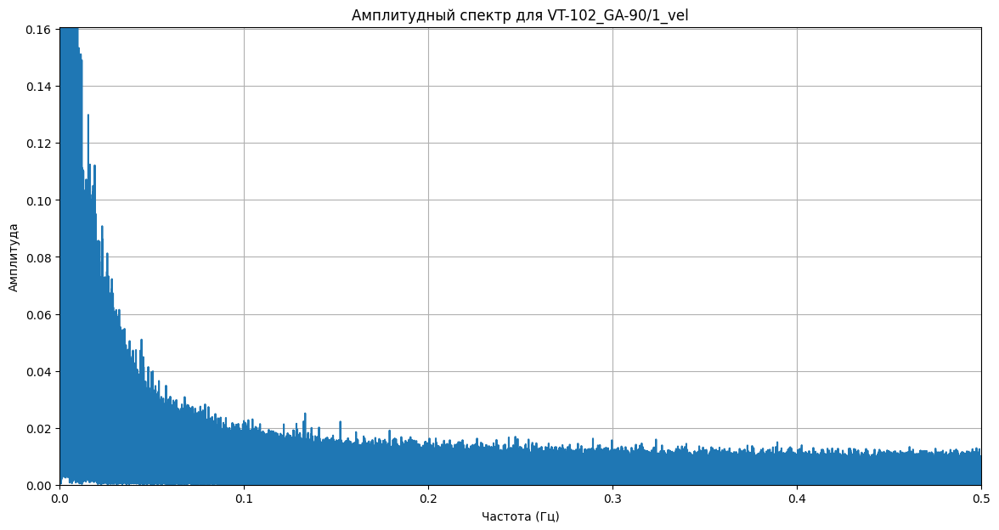

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq

df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\GA-901_combined.csv')

columns = ['VT-101_GA-90/1', 'VT-101_GA-90/1_vel', 'VT-102_GA-90/1', 'VT-102_GA-90/1_vel']

def plot_fft_amplitude_spectrum(data, column_name):
    signal = data[column_name].dropna().values - np.mean(data[column_name].dropna().values)
    n = len(signal)
    yf = fft(signal)
    xf = fftfreq(n, d=1)

    mask = xf >= 0
    xf = xf[mask]
    yf = 2.0/n * np.abs(yf[mask])

    plt.figure(figsize=(14, 7))
    plt.plot(xf, yf)
    plt.title(f'Амплитудный спектр для {column_name}')
    plt.xlabel('Частота (Гц)')
    plt.ylabel('Амплитуда')
    plt.grid()
    plt.xlim(0, 0.5)  # можно изменить в зависимости от интересующего диапазона частот
    plt.ylim(0, max(yf) * 0.01)  # это установит предел по оси Y как 110% от максимальной амплитуды
    plt.show()

for column in columns:
    plot_fft_amplitude_spectrum(df, column)


In [ ]:
import pandas as pd
import numpy as np
from scipy.fft import fft
# теперь вычисляем метрики по вибрации GA 90-1

# Колонки для анализа
columns = ['VT-101_GA-90/1', 'VT-101_GA-90/1_vel', 'VT-102_GA-90/1', 'VT-102_GA-90/1_vel']

# Словарь для сбора статистик
fft_stats = {}

# Перебираем колонки и вычисляем статистики амплитудного спектра
for column in columns:
    signal = df[column].dropna().values
    yf = fft(signal)
    amplitude = np.abs(yf)

    fft_stats[column] = {
        'mean': np.mean(amplitude),
        'median': np.median(amplitude),
        'std': np.std(amplitude),
        'max': np.max(amplitude),
        'min': np.min(amplitude)
    }

# Конвертируем словарь в DataFrame
fft_stats_df = pd.DataFrame(fft_stats)

# Показываем полные статистики
fft_stats_df.describe().style.background_gradient(cmap='Blues')



,VT-101_GA-90/1,VT-101_GA-90/1_vel,VT-102_GA-90/1,VT-102_GA-90/1_vel
count,5.000000,5.000000,5.000000,5.000000
mean,734854.921889,23119159.195046,320233.720329,10075339.465247
std,1641037.019717,51628421.159882,715073.158346,22497956.197045
min,0.077482,7.942329,0.139825,3.903622
25%,244.911137,7702.892513,155.499530,4892.386178
50%,483.196560,15195.286686,266.768054,8392.569054
75%,3116.098281,98030.273307,1351.075893,42512.636907
max,3670430.325987,115474859.580396,1599395.118340,50320895.830475


In [ ]:
''''#опционально оформление датафрейма
# Определение функции для печати красивой таблицы
def print_colored_df(df):
    # ANSI escape-коды для цветов
    HEADER = '\033[95m'
    BLUE = '\033[94m'
    ENDC = '\033[0m'

    # Печатаем заголовки столбцов
    header = " | ".join([HEADER + col + ENDC for col in df.columns])
    print(header)

    # Печатаем строки
    for i, row in df.iterrows():
        colored_row = " | ".join([BLUE + str(x) + ENDC for x in row])
        print(colored_row)

# Показываем полные статистики с использованием функции для печати
print_colored_df(fft_stats_df)


VT-101_GA-90/1 | VT-101_GA-90/1_vel | VT-102_GA-90/1 | VT-102_GA-90/1_vel
483.1965602761886 | 15195.286685693489 | 266.76805423778666 | 8392.56905373553
244.91113651611977 | 7702.892512582334 | 155.49953013669577 | 4892.386177738999
3116.0982807024334 | 98030.27330690957 | 1351.0758933010222 | 42512.63690710219
3670430.3259872515 | 115474859.58039601 | 1599395.1183404676 | 50320895.83047532
0.07748162046603034 | 7.94232854823347 | 0.13982450483370126 | 3.903621733080364


In [ ]:
import pandas as pd
import numpy as np
from scipy.fft import fft, fftfreq

# Загрузка данных
df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\GA-901_combined.csv')

def calculate_and_save_amplitudes(dataframe, column_names, save_path):
    amplitudes = {}
    for column in column_names:
        signal = dataframe[column].dropna().values
        fft_result = fft(signal)
        amplitudes[column] = np.abs(fft_result)

    # Сохраняем амплитуды в DataFrame
    amplitudes_df = pd.DataFrame.from_dict(amplitudes)

    # Сохраняем амплитуды в файл
    amplitudes_df.to_csv(save_path, index=False)

    return amplitudes_df

# Колонки для анализа
columns = ['VT-101_GA-90/1', 'VT-101_GA-90/1_vel', 'VT-102_GA-90/1', 'VT-102_GA-90/1_vel']

# Путь для сохранения амплитуд
save_path = r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\amplitudes.csv'

# Вычисление и сохранение амплитуд
amplitudes_df = calculate_and_save_amplitudes(df, columns, save_path)

# Создание  DataFrame amplitudes_df с амплитудами
print(amplitudes_df.head())


   VT-101_GA-90/1  VT-101_GA-90/1_vel  VT-102_GA-90/1  VT-102_GA-90/1_vel
0    3.670430e+06        1.154749e+08    1.599395e+06        5.032090e+07
1    1.348127e+06        4.240316e+07    5.665221e+05        1.781591e+07
2    6.895291e+05        2.170769e+07    3.063655e+05        9.651309e+06
3    1.715028e+05        5.407954e+06    6.494017e+04        2.050962e+06
4    2.006618e+05        6.327506e+06    7.664672e+04        2.421381e+06


In [ ]:
import pandas as pd
import numpy as np
# ПОИСК АНОМАЛИЙ для GA 90 1
# Загрузка DataFrame с амплитудами
amplitudes_df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\amplitudes.csv')

# Вычисляем пороговые значения для каждого датчика на основе статистики амплитуд
thresholds = {}
for column in amplitudes_df.columns:
    mean_amp = amplitudes_df[column].mean()
    std_amp = amplitudes_df[column].std()
    threshold = mean_amp + 2 * std_amp  # порог равен среднему значению плюс два стандартных отклонения
    thresholds[column] = threshold

# Определяем аномалии как индексы значений, превышающих пороговые
anomalies_indices = {}
for column in amplitudes_df.columns:
    anomaly = amplitudes_df[column] > thresholds[column]
    anomalies_indices[column] = anomaly[anomaly].index.tolist()

# Отображаем пороги и индексы аномальных значений
print("Thresholds for anomaly detection:")
for sensor, threshold in thresholds.items():
    print(f"{sensor}: {threshold}")

print("\nAnomalies detected (indices):")
for sensor, indices in anomalies_indices.items():
    print(f"{sensor}: {indices}")


Thresholds for anomaly detection:
VT-101_GA-90/1: 6715.394527375893
VT-101_GA-90/1_vel: 211255.8775216894
VT-102_GA-90/1: 2968.9204503200967
VT-102_GA-90/1_vel: 93417.86204570289

Anomalies detected (indices):
VT-101_GA-90/1: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 89, 90, 91, 93, 94, 96, 97, 99, 100, 103, 105, 106, 107, 108, 110, 112, 113, 114, 117, 118, 119, 120, 121, 122, 123, 124, 126, 127, 128, 129, 130, 131, 133, 134, 136, 137, 138, 140, 143, 147, 149, 151, 152, 154, 155, 157, 158, 159, 161, 163, 164, 165, 168, 170, 171, 172, 174, 175, 178, 181, 185, 188, 191, 192, 195, 199, 202, 204, 205, 206, 207, 209, 211, 213, 214, 216, 218, 219, 221, 222, 224, 225, 228, 229, 232, 235, 238, 239, 241, 248, 249, 

In [ ]:
amplitudes_df.head()

,VT-101_GA-90/1,VT-101_GA-90/1_vel,VT-102_GA-90/1,VT-102_GA-90/1_vel
0,3.670430e+06,1.154749e+08,1.599395e+06,5.032090e+07
1,1.348127e+06,4.240316e+07,5.665221e+05,1.781591e+07
2,6.895291e+05,2.170769e+07,3.063655e+05,9.651309e+06
3,1.715028e+05,5.407954e+06,6.494017e+04,2.050962e+06
4,2.006618e+05,6.327506e+06,7.664672e+04,2.421381e+06


In [ ]:

# Добавляем булеву колонку 'is_anomaly' для каждого датчика в DataFrame
for column in amplitudes_df.columns:
    amplitudes_df[f'{column}_is_anomaly'] = amplitudes_df[column] > thresholds[column]

# Сохраняем обновленный DataFrame
amplitudes_df.to_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\amplitudes_with_anomalies.csv', index=False)


In [ ]:
print(amplitudes_df.head())  # Показываем начало обновленного DataFrame


   VT-101_GA-90/1  VT-101_GA-90/1_vel  VT-102_GA-90/1  VT-102_GA-90/1_vel  \
0    3.670430e+06        1.154749e+08    1.599395e+06        5.032090e+07   
1    1.348127e+06        4.240316e+07    5.665221e+05        1.781591e+07   
2    6.895291e+05        2.170769e+07    3.063655e+05        9.651309e+06   
3    1.715028e+05        5.407954e+06    6.494017e+04        2.050962e+06   
4    2.006618e+05        6.327506e+06    7.664672e+04        2.421381e+06   

   VT-101_GA-90/1_is_anomaly  VT-101_GA-90/1_vel_is_anomaly  \
0                       True                           True   
1                       True                           True   
2                       True                           True   
3                       True                           True   
4                       True                           True   

   VT-102_GA-90/1_is_anomaly  VT-102_GA-90/1_vel_is_anomaly  
0                       True                           True  
1                       True      

In [ ]:
import pandas as pd
#Проверяем сколько всего аномалий

# Загрузка данных амплитуд с аномалиями
df_amplitudes = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\amplitudes_with_anomalies.csv')

# Подсчет случаев, когда хотя бы один датчик показывает аномалию
anomaly_any_sensor = df_amplitudes[['VT-101_GA-90/1_is_anomaly', 'VT-101_GA-90/1_vel_is_anomaly', 'VT-102_GA-90/1_is_anomaly', 'VT-102_GA-90/1_vel_is_anomaly']].any(axis=1).sum()
print(f"Количество аномалий (хотя бы один датчик): {anomaly_any_sensor}")

# Подсчет случаев, когда все датчики одновременно показывают аномалию
anomaly_all_sensors = df_amplitudes[['VT-101_GA-90/1_is_anomaly', 'VT-101_GA-90/1_vel_is_anomaly', 'VT-102_GA-90/1_is_anomaly', 'VT-102_GA-90/1_vel_is_anomaly']].all(axis=1).sum()
print(f"Количество аномалий (все датчики): {anomaly_all_sensors}")


Количество аномалий (хотя бы один датчик): 19603
Количество аномалий (все датчики): 14471


In [ ]:
#  Очень много аномалий "все датчики"!
# №Исключаем строки, где амплитуды всех датчиков одновременно близки к нулю (например, < 0.01), предполагая останов
not_stop_condition = (df_amplitudes[['VT-101_GA-90/1', 'VT-101_GA-90/1_vel', 'VT-102_GA-90/1', 'VT-102_GA-90/1_vel']] > 0.01).all(axis=1)

# Пересчитываем аномалии с учетом исключения остановов
anomaly_any_sensor_excluding_stop = df_amplitudes[not_stop_condition][['VT-101_GA-90/1_is_anomaly', 'VT-101_GA-90/1_vel_is_anomaly', 'VT-102_GA-90/1_is_anomaly', 'VT-102_GA-90/1_vel_is_anomaly']].any(axis=1).sum()
print(f"Количество аномалий (хотя бы один датчик, исключая останов): {anomaly_any_sensor_excluding_stop}")

anomaly_all_sensors_excluding_stop = df_amplitudes[not_stop_condition][['VT-101_GA-90/1_is_anomaly', 'VT-101_GA-90/1_vel_is_anomaly', 'VT-102_GA-90/1_is_anomaly', 'VT-102_GA-90/1_vel_is_anomaly']].all(axis=1).sum()
print(f"Количество аномалий (все датчики, исключая останов): {anomaly_all_sensors_excluding_stop}")


Количество аномалий (хотя бы один датчик, исключая останов): 19603
Количество аномалий (все датчики, исключая останов): 14471


**Это очень много аномалий, надо попробовать по-другому определить порог, так как есть масштабный выброс по графикам (в начале)**

In [ ]:
import pandas as pd
import numpy as np

# Загрузка DataFrame с амплитудами
amplitudes_df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\amplitudes.csv')

# Вычисляем пороговые значения для каждого датчика на основе медианы и межквартильного размаха
thresholds = {}
for column in amplitudes_df.columns:
    # Вычисляем медиану и IQR
    median_amp = np.median(amplitudes_df[column])
    Q1 = np.percentile(amplitudes_df[column], 25)
    Q3 = np.percentile(amplitudes_df[column], 75)
    IQR = Q3 - Q1

    # Порог равен медиане плюс 1.5 IQR (это типичный выбор для обнаружения выбросов)
    threshold = median_amp + 1.5 * IQR
    thresholds[column] = threshold

# Определяем аномалии как индексы значений, превышающих пороговые
anomalies_indices = {}
for column in amplitudes_df.columns:
    anomaly = amplitudes_df[column] > thresholds[column]
    anomalies_indices[column] = anomaly[anomaly].index.tolist()

# Отображаем пороги и индексы аномальных значений
print("Thresholds for anomaly detection:")
for sensor, threshold in thresholds.items():
    print(f"{sensor}: {threshold}")

print("\nAnomalies detected (indices):")
for sensor, indices in anomalies_indices.items():
    print(f"{sensor}: {indices}")


Thresholds for anomaly detection:
VT-101_GA-90/1: 602.3613258916123
VT-101_GA-90/1_vel: 18940.611227665337
VT-102_GA-90/1: 373.1349255976136
VT-102_GA-90/1_vel: 11735.457544208839

Anomalies detected (indices):
VT-101_GA-90/1: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 17

при разных способах определения порога пока снизить количество аномалий не удалось

In [ ]:
import gc
gc.collect()

210

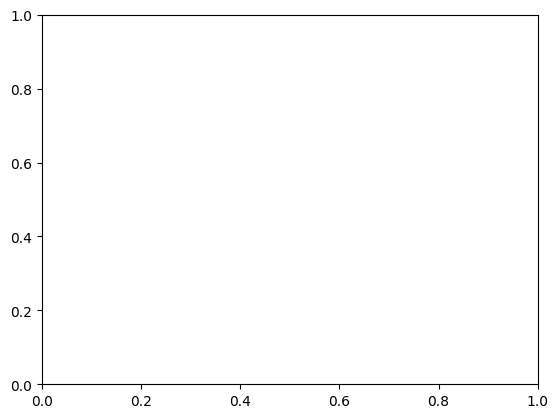

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
# Просили сделать анимацию аномалий


# Загружаем данные
amplitudes_df = pd.read_csv(r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\amplitudes_with_anomalies.csv')

# Функция обновления для анимации
def update(frame):
    plt.cla()  # Очистка текущего акса
    # Отрисовка данных амплитуды для всех датчиков до текущего момента времени
    for column in ['VT-101_GA-90/1', 'VT-101_GA-90/1_vel', 'VT-102_GA-90/1', 'VT-102_GA-90/1_vel']:
        plt.plot(amplitudes_df.index[:frame], amplitudes_df[column][:frame], label=column)
        # Отметка аномалий для каждого датчика
        anomalies = amplitudes_df[amplitudes_df[column+'_is_anomaly'] & (amplitudes_df.index <= frame)]
        plt.scatter(anomalies.index, anomalies[column], color='red', label='Anomaly in '+column)

    plt.legend()
    plt.xlabel('Время')
    plt.ylabel('Амплитуда')
    plt.title('Амплитудный спектр и аномалии')

# Создание объекта анимации
fig, ax = plt.subplots()
ani = FuncAnimation(fig, update, frames=len(amplitudes_df.index), repeat=False)

# Показать анимацию
plt.show()

# Сохранение анимации в GIF файл с использованием Pillow
save_path = r'C:\Users\Admin\Desktop\Питон\Nordal\data_unzipped\GA-90\amplitude_anomalies_animation.gif'
ani.save(save_path, writer='pillow', fps=10)

